# Analisi Esplorativa dei Dati

Analisi alle statistiche principali sfruttando i risultati ottenuti dal training dei modelli.

### Imports

In [1]:
import sys
import pandas as pd
import matplotlib.pyplot as plt
import os
import json
import torch
import numpy as np
import glob
import segmentation_models_pytorch as smp
from torchvision import transforms
from sklearn.model_selection import train_test_split
project_root_dir = os.path.abspath(os.path.join('../notebooks', '..'))
sys.path.append(project_root_dir)
from run import MRIDataset
from PIL import Image

## EDA - Exploratory Data Analysis

In [2]:
print("\n--- Inizio Analisi Esplorativa dei Dati (EDA) ---")

data_root = '../data/lgg-mri-segmentation'
# Raccolta dei percorsi delle immagini e delle maschere
image_paths = []
mask_paths = []
image_folders = glob.glob(os.path.join(data_root, 'TCGA*'))
print(f"Image folders found: {len(image_folders)}")

for folder in image_folders:
    all_tif_files = glob.glob(os.path.join(folder, '*.tif'))
    current_images = sorted([f for f in all_tif_files if '_mask.tif' not in f])
    current_masks = sorted([f for f in all_tif_files if '_mask.tif' in f])

    for img_path in current_images:
        base_name = os.path.basename(img_path)
        mask_base_name = base_name.replace('.tif', '_mask.tif')
        expected_mask_path = os.path.join(folder, mask_base_name)

        if expected_mask_path in current_masks:
            image_paths.append(img_path)
            mask_paths.append(expected_mask_path)
print(f"\nSuccessfully collected {len(image_paths)} image-mask pairs.")


--- Inizio Analisi Esplorativa dei Dati (EDA) ---
Image folders found: 110

Successfully collected 3928 image-mask pairs.


In [3]:
print("\nPerforming a small data exploration for class imbalance...")
sample_size = int(len(mask_paths))
print(f"Analyzing {sample_size} random masks for class imbalance...") 
random_indices = np.random.choice(len(mask_paths), size=sample_size, replace=False)

total_tumor_pixels = 0
total_pixels = 0
train_ratio = 0.8

for i in random_indices:
    mask = Image.open(mask_paths[i]).convert('L')
    mask_array = np.array(mask)
    total_tumor_pixels += np.sum(mask_array > 0) # Assumendo che il tumore sia rappresentato da pixel > 0
    total_pixels += mask_array.size

if total_pixels > 0:
    tumor_percentage = (total_tumor_pixels / total_pixels) * 100
    print(f"Average tumor pixel percentage across {sample_size} random masks: {tumor_percentage:.2f}%")
    if tumor_percentage < 5: 
        print("Note: This dataset shows significant class imbalance (tumor pixels are a small minority).")
        print("      This is common in medical imaging and loss functions like BCEWithLogitsLoss (which you are using) are robust to it,")
        print("      but more advanced techniques like Dice Loss or Focal Loss could be considered for future improvements.")
else:
    print("Could not calculate tumor percentage: No pixels found in sample masks.")


Performing a small data exploration for class imbalance...
Analyzing 3928 random masks for class imbalance...
Average tumor pixel percentage across 3928 random masks: 1.03%
Note: This dataset shows significant class imbalance (tumor pixels are a small minority).
      This is common in medical imaging and loss functions like BCEWithLogitsLoss (which you are using) are robust to it,
      but more advanced techniques like Dice Loss or Focal Loss could be considered for future improvements.


## TRAINING

### Caricamento Dati

In [4]:
# Directory dei log generati e dei grafici
log_dir = '../training_results'

# Caricamento dei log
training_logs = {}
log_json_path = os.path.join(log_dir, 'training_summary.json')
if os.path.exists(log_json_path):
    with open(log_json_path, 'r') as file:
        training_logs = json.load(file)
    print('Caricamento dati del training avvenuto correttamente!')
else:
    print("ATTENZIONE: file trainin_summary.json non trovato. Assicurarsi che venga generato all'interno dello scipt principale run.py ed eseguirlo")
    exit()
training_logs

Caricamento dati del training avvenuto correttamente!


{'U-Net': {'train_loss': [0.043690852877155475,
   0.02539388423503564,
   0.021194522326389142,
   0.018404645235964946,
   0.015285617272932681,
   0.013902793050925519,
   0.010980013450872777,
   0.009825403097661955,
   0.009331709895069778,
   0.008493218062359599],
  'val_loss': [0.029811930996342207,
   0.02319659456565768,
   0.019161445140041002,
   0.016250528251872808,
   0.02223086497014528,
   0.012142448967498807,
   0.010326811647929634,
   0.008708115827905231,
   0.007949490503333113,
   0.008024417748353427],
  'val_dice': [0.5171439484989719,
   0.4940175020667725,
   0.5559526026950691,
   0.5598906096140644,
   0.5810131926112166,
   0.6467174238965868,
   0.6942230856779658,
   0.7414025531453077,
   0.7346945761412275,
   0.7564993902577836],
  'val_iou': [0.4306401604856204,
   0.4114350190376659,
   0.4786431860313164,
   0.47923698568571543,
   0.49744751503359647,
   0.5503275537703515,
   0.6026454040821657,
   0.655378165623175,
   0.6475398170329257,
   0

### Performance dei Modelli

In [6]:
# Implementazione di un dizionario per memorizzare i risultati migliori ogni modello
results = {}

for model_name, logs in training_logs.items():
    df = pd.DataFrame(logs)

    best_epoch_idx = df['val_dice'].idxmax()
    best_val_loss = df.loc[best_epoch_idx, 'val_loss']
    best_dice = df.loc[best_epoch_idx, 'val_dice']
    best_iou = df.loc[best_epoch_idx, 'val_iou']
    best_epoch_num = best_epoch_idx + 1 # type: ignore

    results[model_name] = {
        'Best Epoch': best_epoch_num,
        'Best Val Loss': f"{best_val_loss:.4f}",
        'Best Dice': f"{best_dice:.4f}",
        'Best IoU': f"{best_iou:.4f}"
    }

results_df = pd.DataFrame.from_dict(results, orient='index')   
print("--- Tabella Riassuntiva delle Performance dei Modelli ---")
print(results_df)

--- Tabella Riassuntiva delle Performance dei Modelli ---
                 Best Epoch Best Val Loss Best Dice Best IoU
U-Net                    10        0.0080    0.7565   0.6746
Attention U-Net          10        0.0070    0.8073   0.7287
LinkNet                  10        0.0075    0.7945   0.7138


### Grafici delle Metriche

--- Visualizzazione dei Grafici delle Metriche ---


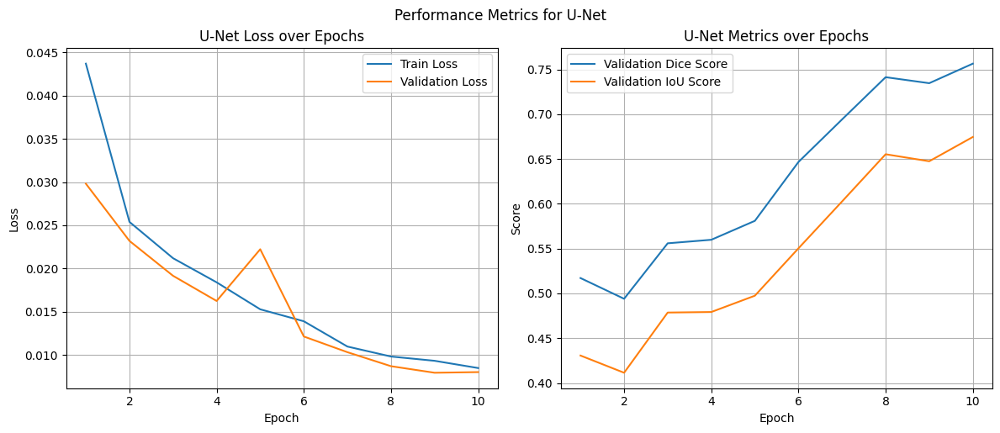

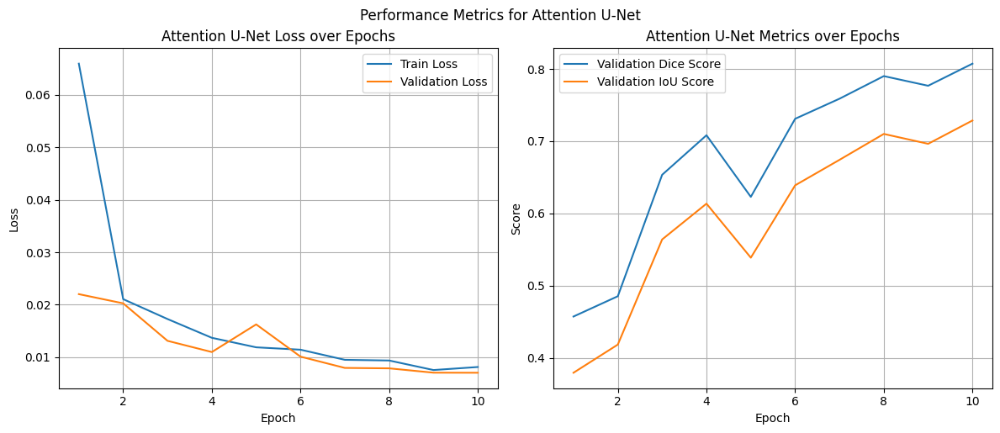

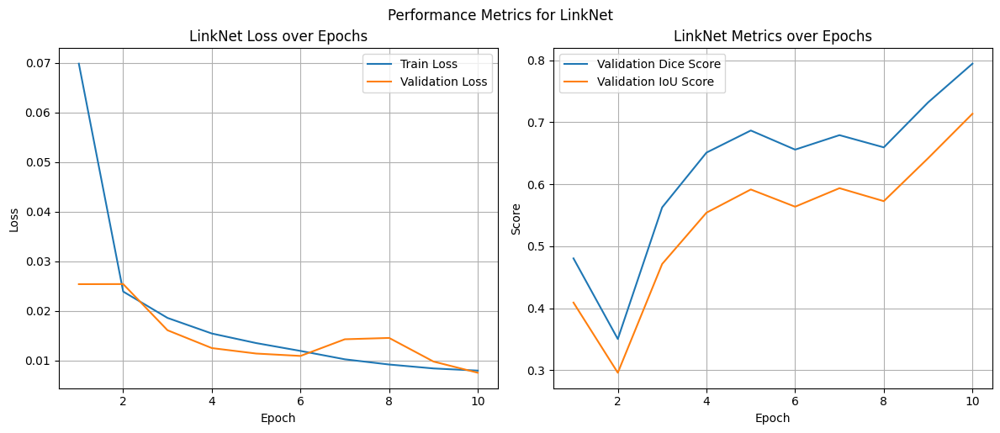

In [7]:
print("--- Visualizzazione dei Grafici delle Metriche ---")
# Analisi e visualizzazione dei grafici
for model_name, logs in training_logs.items():
    plt.figure(figsize=(12, 5))

    # Grafico della Loss
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(logs['train_loss']) + 1), logs['train_loss'], label='Train Loss')
    plt.plot(range(1, len(logs['val_loss']) + 1), logs['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Grafico di Dice e IoU
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(logs['val_dice']) + 1), logs['val_dice'], label='Validation Dice Score')
    plt.plot(range(1, len(logs['val_iou']) + 1), logs['val_iou'], label='Validation IoU Score')
    plt.title(f'{model_name} Metrics over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.suptitle(f'Performance Metrics for {model_name}', y=1.02)
    plt.show()

### Istogrammi delle Metriche

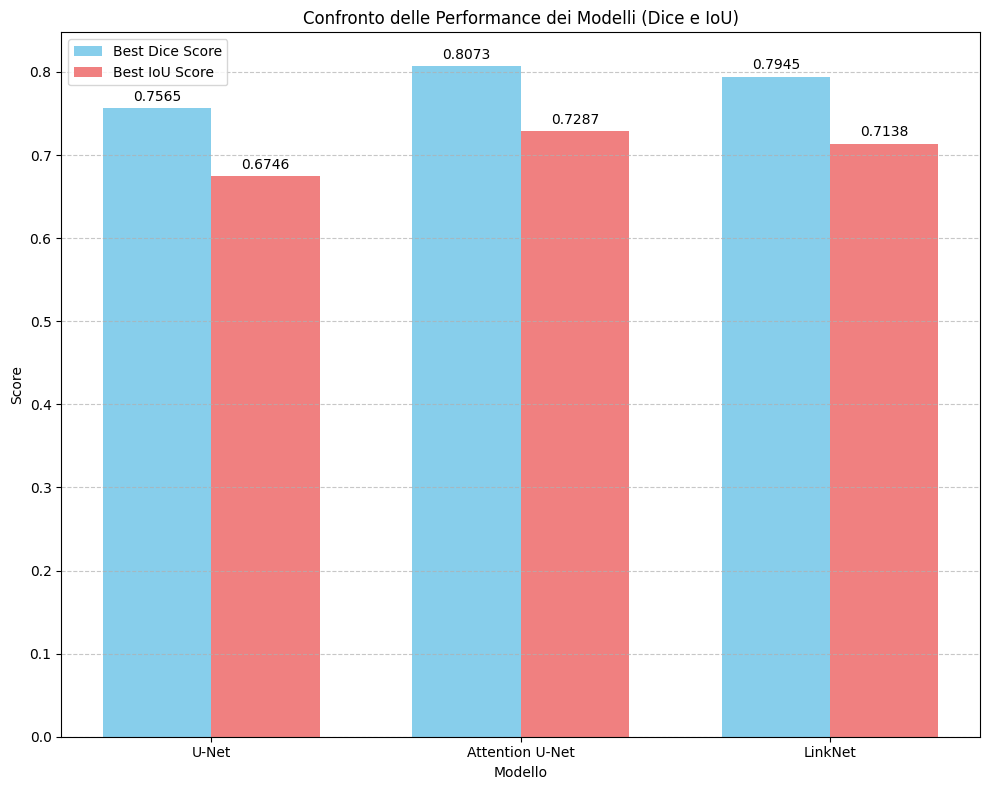

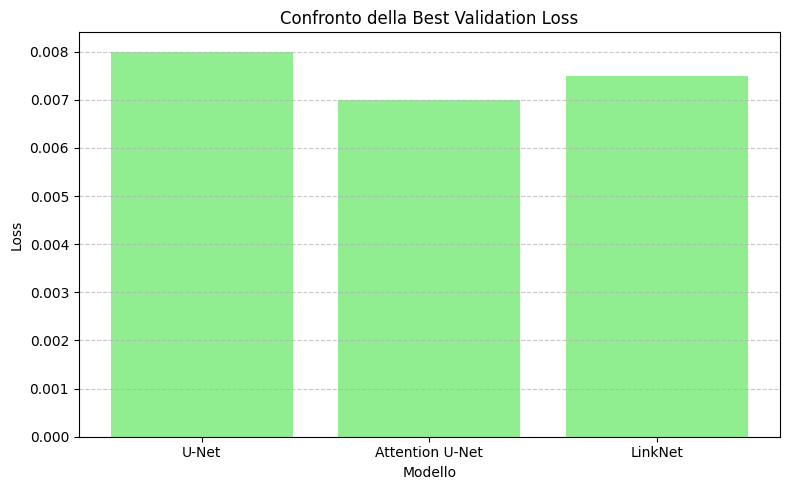

In [8]:
results_df['Best Dice'] = results_df['Best Dice'].astype(float)
results_df['Best IoU'] = results_df['Best IoU'].astype(float)
results_df['Best Val Loss'] = results_df['Best Val Loss'].astype(float)

# --- Creazione del Grafico a Barre Comparativo per Dice e IoU ---
fig, ax = plt.subplots(figsize=(10, 8))

models = results_df.index
dice_scores = results_df['Best Dice']
iou_scores = results_df['Best IoU']

bar_width = 0.35
index = range(len(models))

# Barre per Dice Score
bar1 = ax.bar([i - bar_width/2 for i in index], dice_scores, bar_width, label='Best Dice Score', color='skyblue')
# Barre per IoU Score
bar2 = ax.bar([i + bar_width/2 for i in index], iou_scores, bar_width, label='Best IoU Score', color='lightcoral')

ax.set_xlabel('Modello')
ax.set_ylabel('Score')
ax.set_title('Confronto delle Performance dei Modelli (Dice e IoU)')
ax.set_xticks(index)
ax.set_xticklabels(models)
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.7)

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(bar1)
autolabel(bar2)

plt.tight_layout()
plt.show()

# --- Grafico a barre per la Validation Loss (Opzionale, ma consigliato) ---
fig_loss, ax_loss = plt.subplots(figsize=(8, 5))

val_losses = results_df['Best Val Loss']
bar3 = ax_loss.bar(models, val_losses, color='lightgreen')

ax_loss.set_xlabel('Modello')
ax_loss.set_ylabel('Loss')
ax_loss.set_title('Confronto della Best Validation Loss')
ax_loss.grid(axis='y', linestyle='--', alpha=0.7)

autolabel(bar3)

plt.tight_layout()
plt.show()


## TESTING

### Visualizzazione delle Previsioni

In [9]:
# Configurazione
DATA_ROOT = '../data/lgg-mri-segmentation'
RESULTS_DIR = '../training_results'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Caricamento dei percorsi delle immagini e maschere
all_image_paths = []
all_mask_paths = []
image_folders = glob.glob(os.path.join(DATA_ROOT, 'TCGA*'))

for folder in image_folders:
    all_tif_files = glob.glob(os.path.join(folder, '*.tif'))
    current_images = sorted([f for f in all_tif_files if '_mask.tif' not in f])
    current_masks = sorted([f for f in all_tif_files if '_mask.tif' in f])

    for img_path in current_images:
        base_name = os.path.basename(img_path)
        mask_base_name = base_name.replace('.tif', '_mask.tif')
        expected_mask_path = os.path.join(folder, mask_base_name)

        if expected_mask_path in current_masks:
            all_image_paths.append(img_path)
            all_mask_paths.append(expected_mask_path)

print(f"Total image-mask pairs found in dataset directory: {len(all_image_paths)}")

# Recupero indici di validazione
val_image_paths = []
val_mask_paths = []

# Ricrea lo split train/val per ottenere i percorsi di validazione
data = pd.DataFrame({'image_path': all_image_paths, 'mask_path': all_mask_paths})
train_df, val_df = train_test_split(data, test_size=0.2, random_state=42) 

val_image_paths = val_df['image_path'].tolist()
val_mask_paths = val_df['mask_path'].tolist()
print(f"Found {len(val_image_paths)} validation images based on re-created split.")

Total image-mask pairs found in dataset directory: 3928
Found 786 validation images based on re-created split.


In [10]:
# Definizione dei modelli
models_factories = {
    "U-Net": lambda: smp.Unet(
        encoder_name="resnet34", 
        encoder_weights=None, 
        in_channels=3, 
        classes=1, 
        activation='sigmoid',
    ),
    "Attention U-Net": lambda: smp.Unet(
        encoder_name="resnet34", 
        encoder_weights=None, 
        in_channels=3, 
        classes=1, 
        activation='sigmoid', 
        decoder_attention_type='scse',
    ),
    "LinkNet": lambda: smp.Linknet(
        encoder_name="resnet34", 
        encoder_weights=None, 
        in_channels=3, 
        classes=1, 
        activation='sigmoid',
    )
}

# Caricamento modelli addestrati
loaded_models = {}
for model_name, model_factory in models_factories.items():
    model_path = os.path.join(RESULTS_DIR, f"{model_name.replace(' ', '_').lower()}_best_model.pth")
    if os.path.exists(model_path):
        model = model_factory()
        model.load_state_dict(torch.load(model_path, map_location=DEVICE))
        model.to(DEVICE)
        model.eval()
        loaded_models[model_name] = model
        print(f"Modello {model_name} caricato con successo da {model_path}")
    else:
        print(f"ATTENZIONE: File del modello {model_name} non trovato a {model_path}. Non sarà visualizzato.")

Modello U-Net caricato con successo da ../training_results\u-net_best_model.pth
Modello Attention U-Net caricato con successo da ../training_results\attention_u-net_best_model.pth
Modello LinkNet caricato con successo da ../training_results\linknet_best_model.pth


In [11]:
# Funzione per valutazione delle metriche nelle singole immagini
def calculate_single_metrics(
    prediction_mask, 
    ground_truth_mask,
):
    """
    Calcola il Dice Score e lo IoU per una singola maschera binaria.
    Args:
        prediction_mask (torch.Tensor): La maschera predetta (binaria, 0 o 1). Forma [1, H, W] o [H, W].
        ground_truth_mask (torch.Tensor): La maschera vera (binaria, 0 o 1). Forma [1, H, W] o [H, W].
    Returns:
        tuple: (dice_score, iou_score)
    """
    prediction_mask = prediction_mask.float()
    ground_truth_mask = ground_truth_mask.float()

    if prediction_mask.dim() == 3 and prediction_mask.shape[0] == 1:
        prediction_mask = prediction_mask.squeeze(0)
    if ground_truth_mask.dim() == 3 and ground_truth_mask.shape[0] == 1:
        ground_truth_mask = ground_truth_mask.squeeze(0)

    pred_flat = prediction_mask.view(-1)
    gt_flat = ground_truth_mask.view(-1)

    intersection = (pred_flat * gt_flat).sum()
    union = pred_flat.sum() + gt_flat.sum() - intersection

    epsilon = 1e-6 
    
    dice_score = (2. * intersection + epsilon) / (pred_flat.sum() + gt_flat.sum() + epsilon)
    iou_score = (intersection + epsilon) / (union + epsilon)
    
    return dice_score.item(), iou_score.item()

In [12]:
# Funzione di visualizzazione
def visualize_segmentation(
    image_paths_list, 
    mask_paths_list, 
    models_dict, 
    num_examples=50,
):
    if not models_dict:
        print("Nessun modello caricato per la visualizzazione.")
        return

    import random
    random.seed(42)

    # Seleziona un sottoinsieme casuale di esempi per la visualizzazione
    selected_indices = random.sample(
        range(len(image_paths_list)), 
        min(num_examples, len(image_paths_list)),
    )

    num_cols = 2 + len(models_dict)
    fig, axes = plt.subplots(num_examples, num_cols, figsize=(num_cols * 4, num_examples * 4))

    for i, idx in enumerate(selected_indices):
        img_path = image_paths_list[idx]
        mask_path = mask_paths_list[idx]

        temp_dataset = MRIDataset(
            img_dir='',
            mask_dir='', 
            transform=test_transform,
        )

        temp_dataset.img_paths = [img_path]
        temp_dataset.mask_paths = [mask_path]

        img_tensor_for_model, mask_tensor_for_display = temp_dataset[0]

        # Converti l'immagine tensore normalizzata per la visualizzazione RGB (denormalizza)
        img_display = img_tensor_for_model.cpu().numpy().transpose(1, 2, 0)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_display = std * img_display + mean
        img_display = np.clip(img_display, 0, 1)

        # Plot: Immagine Originale (denormalizzata per la visualizzazione)
        ax = axes[i][0]
        ax.imshow(img_display)
        ax.set_title(f'Originale\n({os.path.basename(img_path).split(".")[0]})', fontsize=10)
        ax.axis('off')

        # Plot: Maschera Ground Truth
        ax = axes[i][1]
        ax.imshow(mask_tensor_for_display.squeeze().cpu().numpy(), cmap='gray')
        ax.set_title('Ground Truth', fontsize=10)
        ax.axis('off')

        # Plot: Previsioni dei Modelli
        model_plot_idx = 2
        for model_name, model in models_dict.items():
            ax = axes[i][model_plot_idx]
            with torch.no_grad():
                outputs = model(img_tensor_for_model.unsqueeze(0).to(DEVICE)) # Aggiungi la dimensione del batch
                predicted_mask_binary = (outputs.squeeze().cpu() > 0.5).float() 

                dice, iou = calculate_single_metrics(predicted_mask_binary, mask_tensor_for_display.squeeze().cpu())

            ax.imshow(predicted_mask_binary.numpy(), cmap='gray')
            ax.set_title(f'Predizione {model_name}\nDice: {dice:.4f}, IoU: {iou:.4f}', fontsize=10)            
            ax.axis('off')
            model_plot_idx += 1
    
    plt.tight_layout()
    plt.show()

--- Visualizzazione delle Previsioni dei Modelli su Esempi di Validazione ---


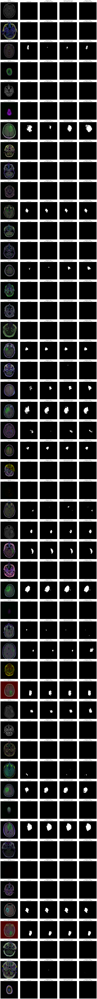

In [13]:
# VISUALIZZAZIONI
print("--- Visualizzazione delle Previsioni dei Modelli su Esempi di Validazione ---")
visualize_segmentation(val_image_paths, val_mask_paths, loaded_models)